In [1]:
using DifferentialEquations, LinearAlgebra, Plots, LaTeXStrings, PGFPlotsX
gr()

Plots.GRBackend()

### Initialization

In [2]:
#Basis state
r = [0;1]
g = [1;0]

#initial state of the system
α = 1
β = sqrt(1-α^2)
ψ_a = α.*r + β.*g
ψ_1 = g

ψ_0 = [g,ψ_a,g]
ρ_0 = complex(reduce(kron,ψ_0) * reduce(kron,ψ_0)');

In [3]:
struct parameters
    Ω1::Float64
    Ω2::Float64     
    γ_Decay::Float64     
    γ_dephase::Float64
    V1_nn::Float64 
    V2_nn::Float64
 end

In [4]:
nothing
function (p::parameters)(t)
    global Δ1_0 = Δ1_0
    global δ1 =  δ1
    global Δ2_0 = Δ2_0
    global δ2 =  δ2

    tf = 640
    if t<tf
        return (Δ1_0-δ1*t, Δ2_0, p.Ω1, p.Ω2, p.γ_Decay, p.γ_dephase, p.V1_nn, p.V2_nn)
    else
        return (Δ1_0-δ1*t, Δ2_0-δ2*(t-tf), p.Ω1, p.Ω2, p.γ_Decay, p.γ_dephase, p.V1_nn, p.V2_nn)
    end
end

In [5]:
Δ1_0 = 1032
δ1 = 0.1
Δ2_0 = 1032
δ2 = 0.1
p = parameters(1,1,0,0,-1000,-1000)

# tspan = (0.0,582)

parameters(1.0, 1.0, 0.0, 0.0, -1000.0, -1000.0)

In [6]:
σ_x = [0 1; 1 0]
n = [0 0; 0 1]
Π_g = [1 0; 0 0]
I = [1 0; 0 1]
σ_minus = [0 1; 0 0]
σ_plus = [0 0; 1 0]
σ_z = [1 0; 0 -1]

#parameters
Δ1_t, Δ2_t, Ω1, Ω2, γ_Decay, γ_dephase, V1_nn, V2_nn = p(1)


#Hamiltonian elements
nn_sys = [kron(n,n,I), kron(I,n,n), kron(n,I,n)]
σminus_sys = [reduce(kron,[I,σ_minus,I]),reduce(kron,[I,I,σ_minus])]
σplus_sys = [reduce(kron,[I,σ_plus,I]), reduce(kron,[I,I,σ_plus])]
σz_sys = [reduce(kron,[I,σ_z,I]), reduce(kron,[I,I,σ_z])]
n_sys = [reduce(kron,[n,I,I]),reduce(kron,[I,n,I]), reduce(kron,[I,I,n])]
σx_sys = [reduce(kron,[σ_x,I,I]),reduce(kron,[I,σ_x,I]), reduce(kron,[I,I,σ_x])]

#Hamiltonian
H = Ω1/2 .* σx_sys[1] + Ω2/2 .* σx_sys[3] + V1_nn .* nn_sys[1] + V2_nn .* nn_sys[2] +
    Δ1_t .* n_sys[1] + Δ2_t .*n_sys[3]

8×8 Matrix{Float64}:
 0.0     0.5  0.0   0.0     0.5     0.0   0.0   0.0
 0.5  1032.0  0.0   0.0     0.0     0.5   0.0   0.0
 0.0     0.0  0.0   0.5     0.0     0.0   0.5   0.0
 0.0     0.0  0.5  32.0     0.0     0.0   0.0   0.5
 0.5     0.0  0.0   0.0  1031.9     0.5   0.0   0.0
 0.0     0.5  0.0   0.0     0.5  2063.9   0.0   0.0
 0.0     0.0  0.5   0.0     0.0     0.0  31.9   0.5
 0.0     0.0  0.0   0.5     0.0     0.0   0.5  63.9

### Functions

In [7]:
struct parameters
    Ω1::Float64
    Ω2::Float64     
    γ_Decay::Float64     
    γ_dephase::Float64
    V1_nn::Float64 
    
    V2_nn::Float64
 end

In [8]:
nothing
function (p::parameters)(t)
    global Δ1_0 = Δ1_0
    global δ1 =  δ1
    global Δ2_0 = Δ2_0
    global δ2 =  δ2

    tf = 0
    if t<tf
        return (Δ1_0-δ1*t, Δ2_0, p.Ω1, p.Ω2, p.γ_Decay, p.γ_dephase, p.V1_nn, p.V2_nn)
    else
        return (Δ1_0-δ1*t, Δ2_0-δ2*(t-tf), p.Ω1, p.Ω2, p.γ_Decay, p.γ_dephase, p.V1_nn, p.V2_nn)
    end
end


#Master Equation
nothing
function master_eqn(dρ,ρ,p,t)

    n_atoms = 2
    #2x2 Matrices
    σ_x = [0 1; 1 0]
    n = [0 0; 0 1]
    Π_g = [1 0; 0 0]
    I = [1 0; 0 1]
    σ_minus = [0 1; 0 0]
    σ_plus = [0 0; 1 0]
    σ_z = [1 0; 0 -1]

    #parameters
    Δ1_t, Δ2_t, Ω1, Ω2, γ_Decay, γ_dephase, V1_nn, V2_nn = p(t)


    #Hamiltonian elements
    nn_sys = [kron(n,n,I), kron(I,n,n), kron(n,I,n)]
    σminus_sys = [reduce(kron,[I,σ_minus,I]),reduce(kron,[I,I,σ_minus])]
    σplus_sys = [reduce(kron,[I,σ_plus,I]), reduce(kron,[I,I,σ_plus])]
    σz_sys = [reduce(kron,[I,σ_z,I]), reduce(kron,[I,I,σ_z])]
    n_sys = [reduce(kron,[n,I,I]),reduce(kron,[I,n,I]), reduce(kron,[I,I,n])]
    σx_sys = [reduce(kron,[σ_x,I,I]),reduce(kron,[I,σ_x,I]), reduce(kron,[I,I,σ_x])]

    #Hamiltonian
    H = Ω1/2 .* σx_sys[1] + Ω2/2 .* σx_sys[3] + V1_nn .* nn_sys[1] + V2_nn .* nn_sys[2] +
        Δ1_t .* n_sys[1] + Δ2_t .* n_sys[3]

    #lindbaldian terms
    l_decay = zeros(2^(n_atoms+1),2^(n_atoms+1))
    l_dephase = zeros(2^(n_atoms+1),2^(n_atoms+1))

    for i in 1:2
        l_decay += γ_Decay.*(σminus_sys[i] * ρ * σplus_sys[i] - 0.5.*((σplus_sys[i]*σminus_sys[i]*ρ)
                         + (ρ*σplus_sys[i]*σminus_sys[i])))
        l_dephase += γ_dephase.*(σz_sys[i]* ρ *σz_sys[i] - ρ)
    end

    dρ .= -1im .* (H*ρ - ρ*H) + l_decay + l_dephase
end


#Solving the master equation
nothing
function solve_master_eqn(p)
    global δ1 = δ1
    tspan = (0.0,2*(Δ1_0+p(0)[end-1])/δ1)
    eqn = ODEProblem(master_eqn, ρ_0, tspan, p)
    sol = solve(eqn, Rodas3(autodiff=false),saveat=1)
    return sol
end


# Extracting populations from the solution
nothing
function rydberg_populations(sol)
    n = [0 0; 0 1]
    I = [1 0; 0 1]

    a = reduce(kron,[n,I,I])
    rydberg1 = [real(tr(a*ρ)) for ρ in sol.u]

    b = reduce(kron,[I,I,n])
    rydberg2 = [real(tr(b*ρ)) for ρ in sol.u]

    c = reduce(kron,[n,I,n])
    rydberg12 = [real(tr(c*ρ)) for ρ in sol.u]

    return rydberg1, rydberg2, rydberg12
end

rydberg_populations (generic function with 1 method)

### System Dynamics

In [9]:
2*(1032 - 1000) / 0.1

640.0

In [10]:
Δ1_0 = 1032
δ1 = 0.1
Δ2_0 = 1032
δ2 = 0.1
p = parameters(1,1,0,0,-1000,-1000)

tspan = (0.0,1*640)
eqn = ODEProblem(master_eqn, ρ_0, tspan, p)
solution = solve(eqn, Rodas4P(autodiff=false),saveat=0.01);

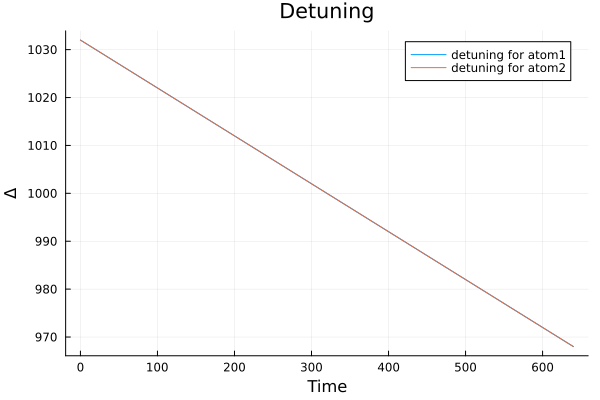

In [11]:
T = solution.t
Δ1_T = Array{Float64}(undef,length(T))
Δ2_T = Array{Float64}(undef,length(T))

for i in 1:length(T)
    t = T[i]
    Δ1_T[i] = p(t)[1]
    Δ2_T[i] = p(t)[2]
end
plot(T,Δ1_T,label="detuning for atom1",xaxis="Time",yaxis="Δ",title="Detuning")
plot!(T,Δ2_T,label="detuning for atom2",xaxis="Time",yaxis="Δ",title="Detuning")

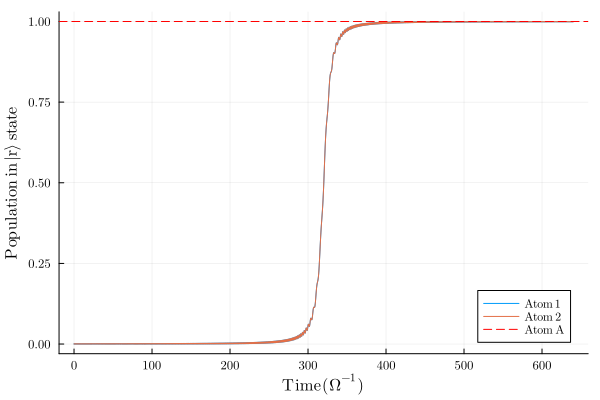

In [12]:
r1,r2,r12 = rydberg_populations(solution)

# Plotting the Rydberg state population over time
fig = plot(solution.t, r1, label=L"\mathrm{Atom\;1}", fontfamily="Computer Modern", fontsize=20,
xlabel=L"\mathrm{Time\,(\Omega^{-1})}", ylabel=L"\mathrm{Population\;in\;|r\rangle\;state}")
plot!(solution.t, r2, label=L"\mathrm{Atom\;2}")
hline!([1],color=:red,linestyle=:dash,label=L"\mathrm{Atom\;A}")
# savefig("/Users/akashmalemath/Documents/master_work/rydberg_qec/images/part3/rap/2atoms_site_independent_population_plot.pdf")

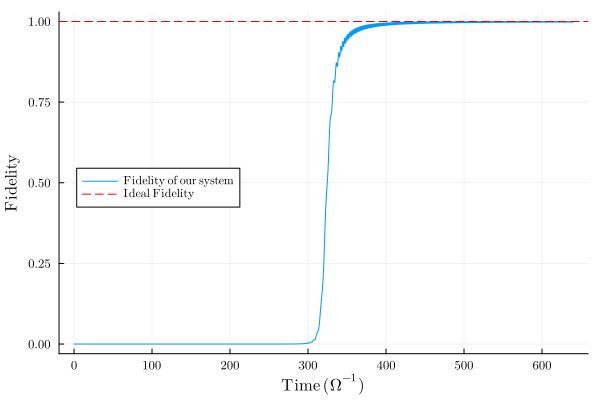

In [13]:
a = [r,r,r]
b = [g,g,g]
ψ_ideal = α*reduce(kron,a)+ β*reduce(kron,b)

fidelities = []
time = []
for (t,ρ) in zip(solution.t,solution.u)
    fidelity = ψ_ideal' * ρ * ψ_ideal
    push!(fidelities,fidelity)
    push!(time,t)
end

fig2 = plot(time,real(fidelities),label=L"\mathrm{Fidelity\;of\;our\;system}", fontsize=10, fontfamily="Computer Modern",
xaxis=L"\mathrm{Time\;(\Omega^{-1})}",yaxis=L"\mathrm{Fidelity}", legend=:left)#,title=L"Fidelity")
hline!([1], color=:red, linestyle=:dash, label=L"\mathrm{Ideal\;Fidelity}")
# savefig("/Users/akashmalemath/Documents/master_work/rydberg_qec/images/part3/rap/2atoms_fidelity_plot.pdf")

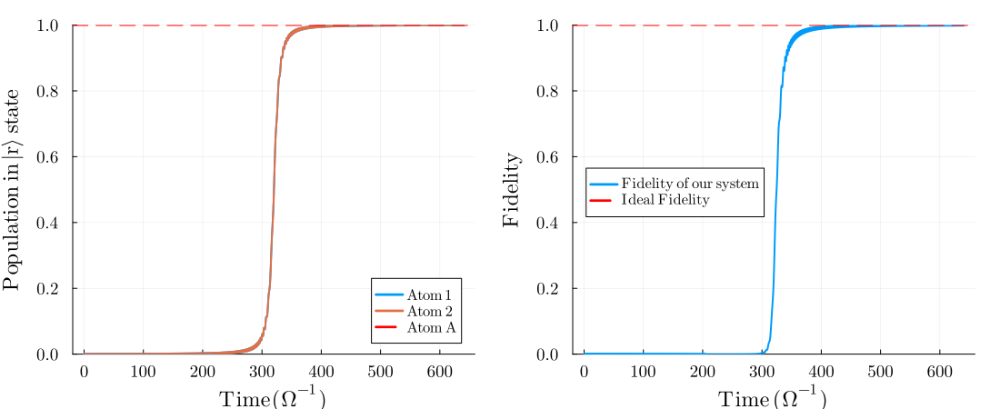

In [14]:
p = plot(fig, fig2;
    layout=(1,2),
    labelfontsize=16,
    tickfontsize=12,
    legendfontsize=11,
    legendsize = (0.8,0.5),
    lw=2,
    fontstyle="Computer Modern",
    link=:y,                # share y-scale
    size=(1100,450),
    ylim=[-0.0,1.0],
    # markersize=4,
    fontsize=20,
    fontfamily="Computer Modern",
    margin=5Plots.mm)
savefig(p, "/Users/akashmalemath/Documents/master_work/rydberg_thesis/rydberg_qec/images/part3/rap/site_independent.pdf")
display(p)

### Observations

In [54]:
r1_end = r1[end]
r2_end = r2[end]
println("The population of the Rydberg state for atom1 is $r1_end which is equivalent to P_LZ = 1e-4 + some numerical inconsistencies
The population of Rydberg state for atom2 is $r2_end which is equivalent to P_LZ = 1e-4 but also depends on previous atom population")

The population of the Rydberg state for atom1 is 0.9993359221437854 which is equivalent to P_LZ = 1e-4 + some numerical inconsistencies
The population of Rydberg state for atom2 is 0.9993359221450242 which is equivalent to P_LZ = 1e-4 but also depends on previous atom population
